In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.model_selection import train_test_split
%matplotlib inline

In [2]:
135/3

45.0

In [4]:
728/3

242.66666666666666

In [2]:
def evaluate(): #function which will output the confusion matrix and metrics
    print("Confusion Matrix")
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    print(cnf_matrix)
 
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    print("Precision:",metrics.precision_score(y_test, y_pred))
    print("Recall:",metrics.recall_score(y_test, y_pred))

    class_names= [0,1] # name of classes
    fig, ax = plt.subplots()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)
    # create heatmap
    sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap='YlGnBu_r' ,fmt='g')
    ax.xaxis.set_label_position("top")
    plt.tight_layout()
    plt.title('Confusion matrix', y=1.1)
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

def roc(): #area under the curve roc plot
    y_pred_proba = logreg.predict_proba(X_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
    auc = metrics.roc_auc_score (y_test, y_pred_proba)
    plt.plot(fpr, tpr, label="data 1, auc="+str(auc))
    plt.legend(loc=4) 
    plt.show()

In [3]:
data = pd.read_csv('breast-cancer-wisconsin.csv', header=None) #load data
data.drop(columns=0, inplace=True)
data.head()

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
data.shape

(569, 31)

In [5]:
data[1].value_counts() #number of each diagnosis

B    357
M    212
Name: 1, dtype: int64

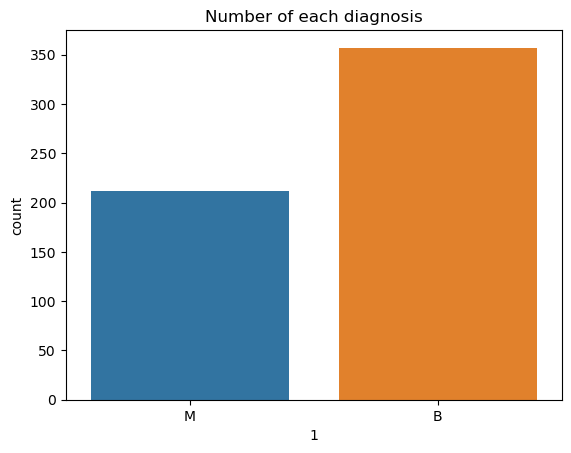

In [6]:
sns.countplot(x=data[1]); #plot of diagnosis
plt.title("Number of each diagnosis")
plt.show()

From the above graph, we note that we have an unbalanced dataset with more Diagnosis’s being bernign 

In [7]:
# Changing the label of the data 
data = data.replace({1: {'M': 1, 'B':0}})
data

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [8]:
sns.PairGrid(data).map(sns.scatterplot); #pairplot to find any correlation in data

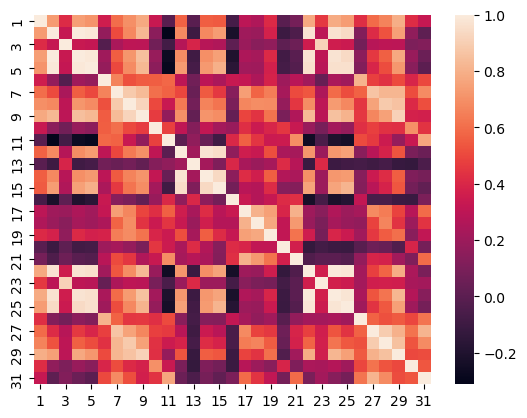

In [9]:
sns.heatmap(data.corr(), annot=False); #heatmap showing correlation level between variables

From the above scatterplot and heatmap, we can see definitive correlations between some of the variables. This bodes well for our analysis and we should expect high accuracy for some of our models. Although, correlations found here may not be useful and have no relevance to our classification.

In [10]:
y = data[1] #defining x and y
X = data.drop(columns=1)

In [11]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.3, random_state=0) #splitting data

Confusion Matrix
[[102   6]
 [  2  61]]
Accuracy: 0.9532163742690059
Precision: 0.9104477611940298
Recall: 0.9682539682539683


/Users/robwhittey/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


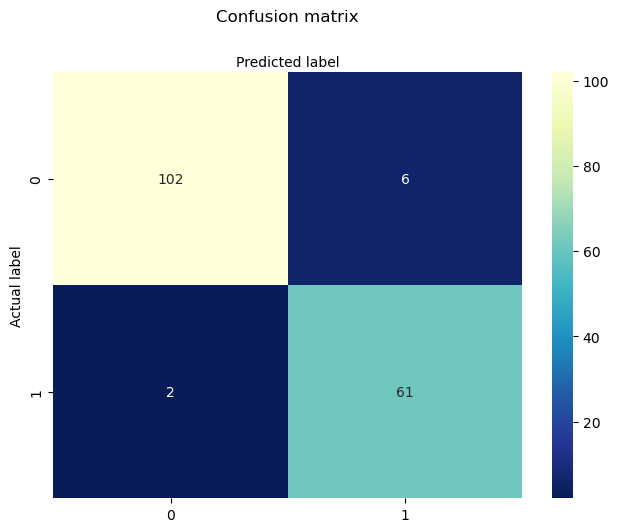

Confusion Matrix
[[107   1]
 [  3  60]]
Accuracy: 0.9766081871345029
Precision: 0.9836065573770492
Recall: 0.9523809523809523


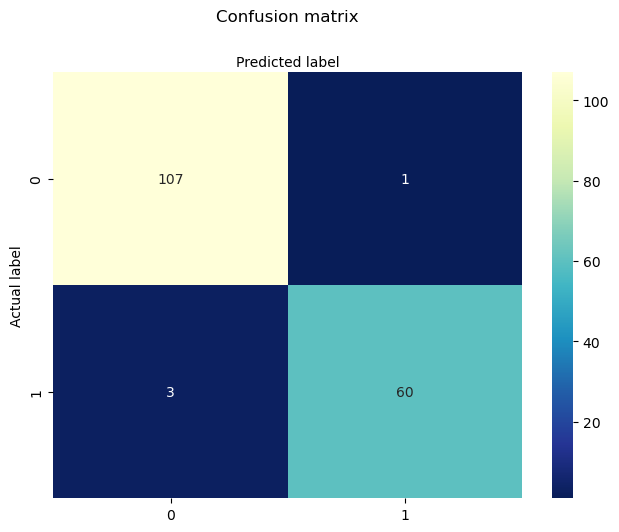

In [12]:
""" ***** test for comparison: normalised data ***** """

from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
evaluate()

X_train1,X_test1,y_train,y_test = train_test_split(X,y, test_size=0.3, random_state=0)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train1)
X_train1 = scaler.transform(X_train1)
X_test1 = scaler.transform(X_test1)

logreg = LogisticRegression()
logreg.fit(X_train1, y_train)
y_pred = logreg.predict(X_test1)
evaluate()

Better results with normalised data since all metrics are greater 

Confusion Matrix
[[106   2]
 [  1  62]]
Accuracy: 0.9824561403508771
Precision: 0.96875
Recall: 0.9841269841269841


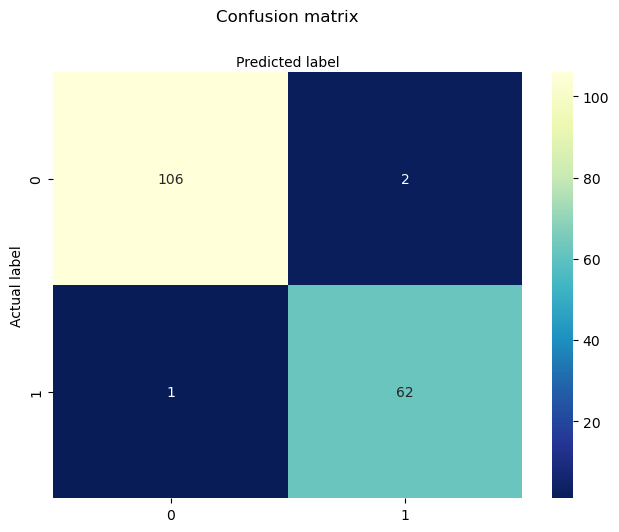

In [13]:
""" ***** test for comparison: random state ***** """
X_train2,X_test2,y_train,y_test = train_test_split(X,y, test_size=0.3, random_state=42)

scaler = StandardScaler()
scaler.fit(X_train2)
X_train2 = scaler.transform(X_train2)
X_test2 = scaler.transform(X_test2)

logreg = LogisticRegression()
logreg.fit(X_train2, y_train)
y_pred = logreg.predict(X_test2)
evaluate()

Better results found with random state = 42 as metrics increased

In [14]:
""" ***** test for comparison: test size ***** """
sizes = [0.5,0.4,0.3,0.25,0.2,0.1,0.05]
for i in sizes:
    print("test size:", i)
    X_train3,X_test3,y_train,y_test = train_test_split(X,y, test_size=i, random_state=42)

    scaler = StandardScaler()
    scaler.fit(X_train3)
    X_train3 = scaler.transform(X_train3)
    X_test3 = scaler.transform(X_test3)

    logreg = LogisticRegression()
    logreg.fit(X_train3, y_train)
    y_pred = logreg.predict(X_test3)

    print("Confusion Matrix")
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    print(cnf_matrix)
 
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    print("Precision:",metrics.precision_score(y_test, y_pred))
    print("Recall:",metrics.recall_score(y_test, y_pred))

test size: 0.5
Confusion Matrix
[[185   2]
 [  2  96]]
Accuracy: 0.9859649122807017
Precision: 0.9795918367346939
Recall: 0.9795918367346939
test size: 0.4
Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875
test size: 0.3
Confusion Matrix
[[106   2]
 [  1  62]]
Accuracy: 0.9824561403508771
Precision: 0.96875
Recall: 0.9841269841269841
test size: 0.25
Confusion Matrix
[[87  2]
 [ 1 53]]
Accuracy: 0.9790209790209791
Precision: 0.9636363636363636
Recall: 0.9814814814814815
test size: 0.2
Confusion Matrix
[[70  1]
 [ 2 41]]
Accuracy: 0.9736842105263158
Precision: 0.9761904761904762
Recall: 0.9534883720930233
test size: 0.1
Confusion Matrix
[[40  0]
 [ 1 16]]
Accuracy: 0.9824561403508771
Precision: 1.0
Recall: 0.9411764705882353
test size: 0.05
Confusion Matrix
[[18  0]
 [ 1 10]]
Accuracy: 0.9655172413793104
Precision: 1.0
Recall: 0.9090909090909091


Test size of 0.4 is best

In [15]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.4, random_state=42) #best data split and normalisation

scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train))
X_test = pd.DataFrame(scaler.transform(X_test))

## Logistic regression

In [16]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

In [17]:
print(X_test[0:1])
print("Actual dignoses: " + str(y_test[0:1])[-15] + ". Predicited: " + str(y_pred[0:1]) + " where 1=Malignant and 0=Bernign")

         0         1         2         3        4         5         6   \
0 -0.498815 -0.145253 -0.477883 -0.507759  0.24595  0.025713 -0.132045   

         7         8         9   ...        20        21        22        23  \
0 -0.296427  0.462293  0.158735  ... -0.288508 -0.151999 -0.356821 -0.366691   

       24        25        26        27        28        29  
0  0.4707 -0.086536 -0.030254 -0.216645  0.222637  0.229825  

[1 rows x 30 columns]
Actual dignoses: 1. Predicited: [0] where 1=Malignant and 0=Bernign


Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875


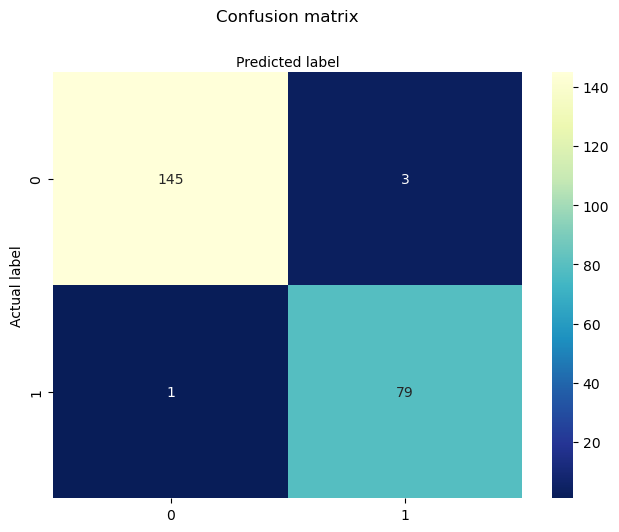

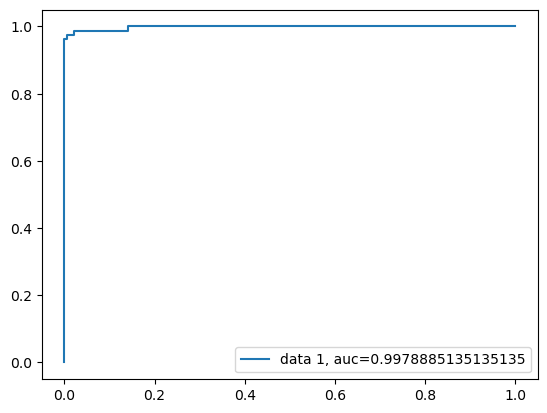

In [18]:
evaluate()
roc()

Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875


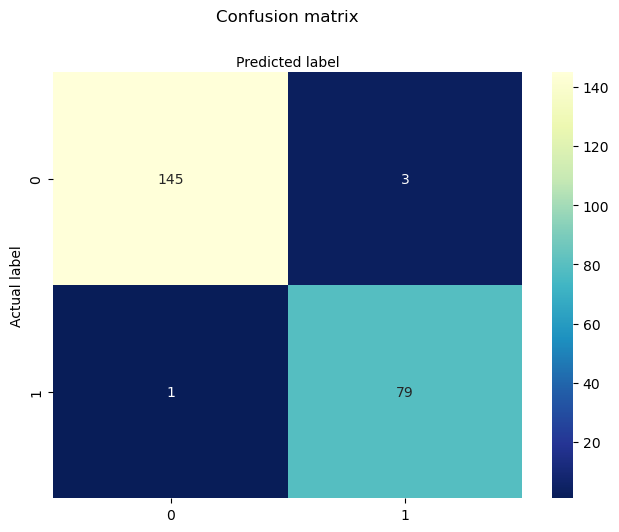

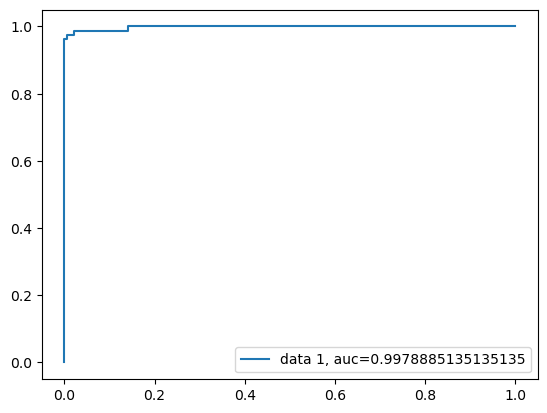

In [19]:
"""***** Higher iteration *****"""
logreg = LogisticRegression(max_iter=10000)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
evaluate()
roc()

Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875


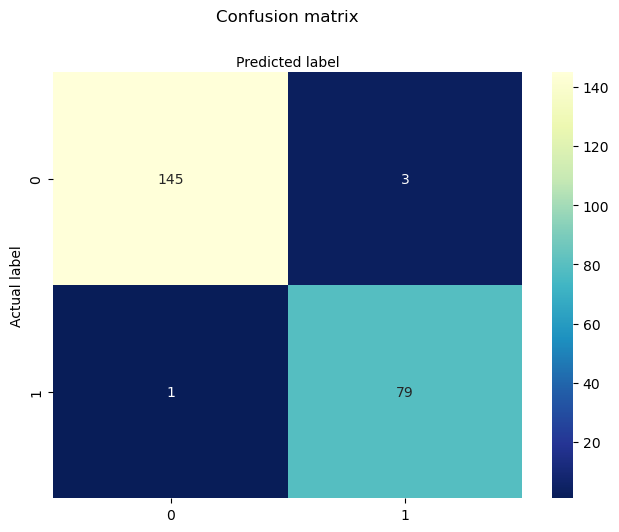

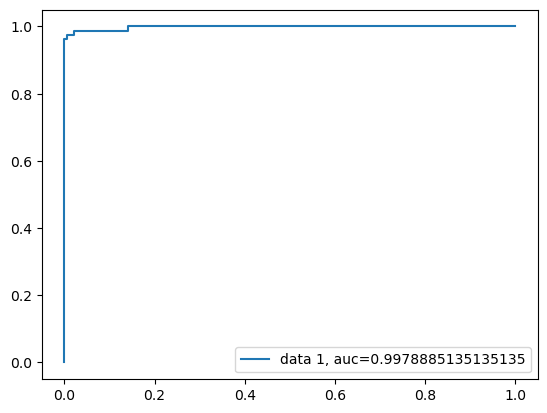

In [20]:
"""***** Different solver *****"""
logreg = LogisticRegression(max_iter=1000,solver = 'liblinear')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
evaluate()
roc()

Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875


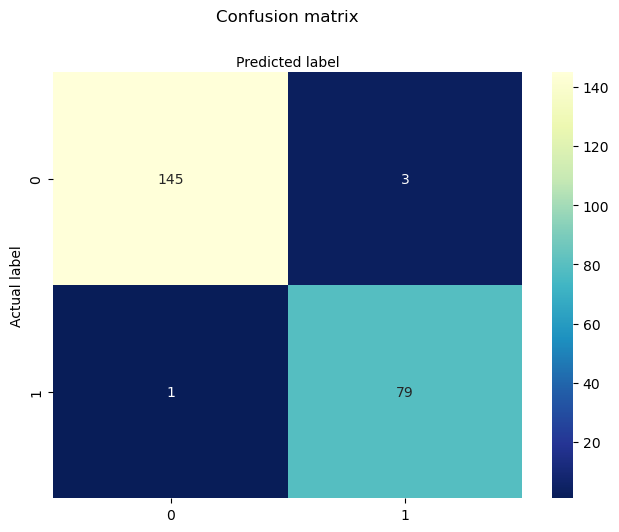

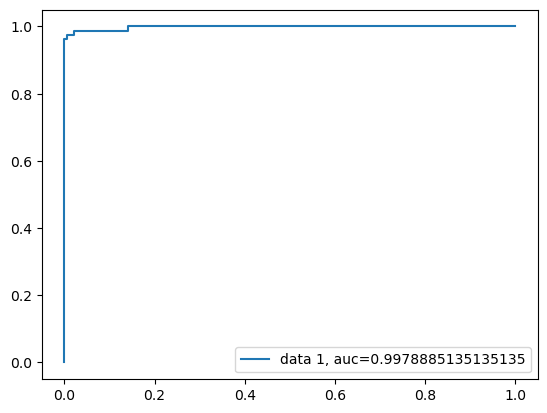

In [21]:
"""***** Different solver *****"""
logreg = LogisticRegression(max_iter=1000,solver = 'saga')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
evaluate()
roc()

Confusion Matrix
[[145   3]
 [  1  79]]
Accuracy: 0.9824561403508771
Precision: 0.9634146341463414
Recall: 0.9875


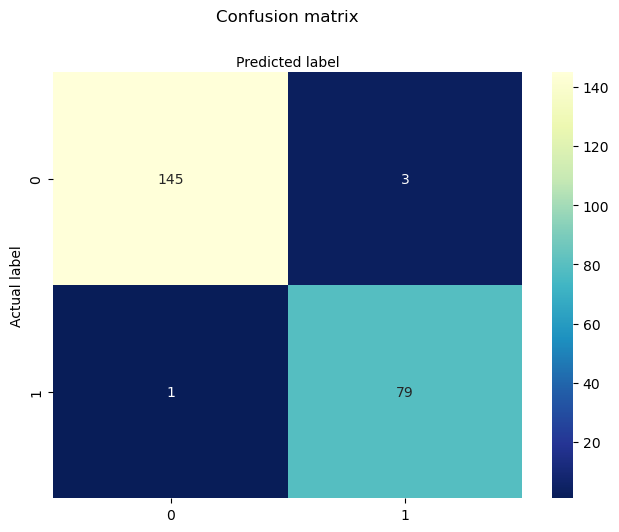

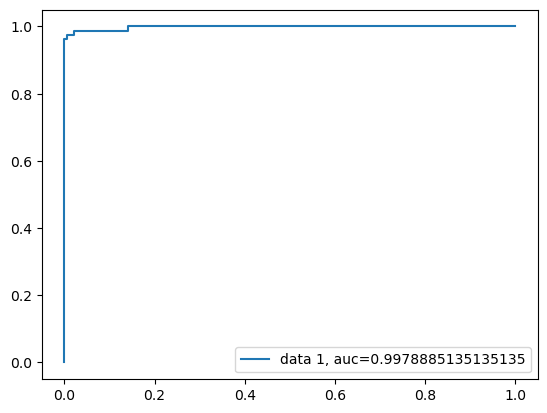

In [22]:
"""***** Different solver *****"""
logreg = LogisticRegression(max_iter=10000,solver = 'newton-cg')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
evaluate()
roc()

Confusion Matrix
[[144   4]
 [  3  77]]
Accuracy: 0.9692982456140351
Precision: 0.9506172839506173
Recall: 0.9625


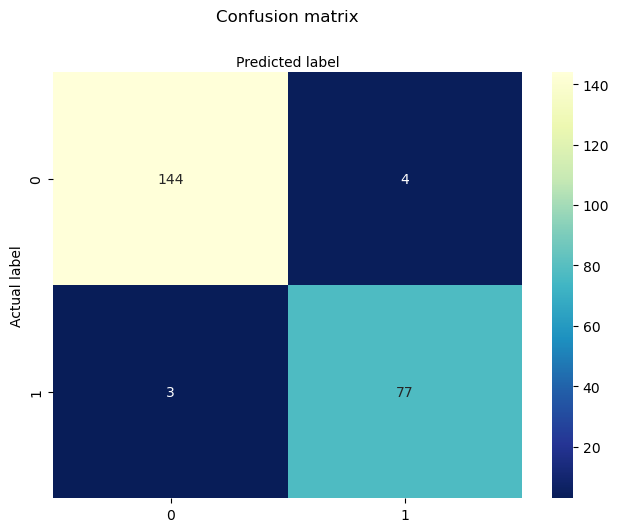

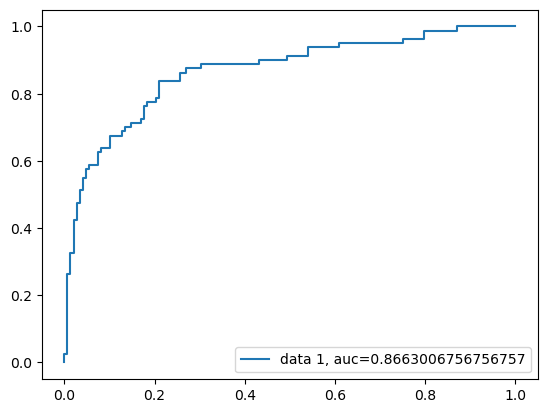

In [23]:
"""***** Non-normalised data *****"""
X_train5,X_test5,y_train,y_test = train_test_split(X,y, test_size=0.4, random_state=42)
logreg = LogisticRegression(max_iter=10000,solver = 'newton-cg')
logreg.fit(X_train5, y_train)
y_pred = logreg.predict(X_test5)
evaluate()
roc()

In [24]:
""" Normalised data: so x and y line up"""
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.4, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train))
X_test = pd.DataFrame(scaler.transform(X_test))

### Genetic Algorithms

In [25]:
from sklearn.metrics import accuracy_score
#defining various steps required for the genetic algorithm 
def initilization_of_population(size,n_feat):
    population = []
    for i in range(size):
        chromosome = np.ones(n_feat, dtype=np.bool_)
        chromosome[:int(0.3*n_feat)]=False 
        np.random.shuffle(chromosome)
        print(chromosome)
        population.append(chromosome)
    return population

def fitness_score(population):
    scores = []
    for chromosome in population:
        logmodel.fit(X_train.iloc[:,chromosome],y_train)
        y_pred = logmodel.predict(X_test.iloc[:,chromosome])
        scores.append(accuracy_score(y_test,y_pred))
    scores, population = np.array(scores), np.array(population)
    inds = np.argsort(scores)
    return list(scores[inds][::-1]), list(population[inds,:][::-1])

def selection(pop_after_fit,n_parents):
    population_nextgen = []
    for i in range(n_parents):
        population_nextgen.append(pop_after_fit[i])
    return population_nextgen

def crossover(pop_after_sel):
    population_nextgen=pop_after_sel 
    for i in range(len(pop_after_sel)): 
        child=pop_after_sel[i]
        child[3:7]=pop_after_sel[(i+1)%len(pop_after_sel)][3:7]
        population_nextgen.append(child)
    return population_nextgen

def mutation(pop_after_cross,mutation_rate):
    #import random
    population_nextgen = []
    for i in range(0,len(pop_after_cross)):
        chromosome = pop_after_cross[i]
        for j in range(len(chromosome)):
            if random.random() < mutation_rate:
                chromosome[j]= not chromosome[j]
        population_nextgen.append(chromosome)
    #print (population_nextgen)
    return population_nextgen

def generations(size, n_feat, n_parents, mutation_rate, n_gen, X_train,
                X_test, y_train, y_test):
    best_chromo= []
    best_score= []
    population_nextgen=initilization_of_population(size,n_feat)
    for i in range(n_gen):
        scores, pop_after_fit = fitness_score(population_nextgen)
        #print (pop_after_fit[0])
        print(scores[0])
        pop_after_sel = selection(pop_after_fit,n_parents)
        pop_after_cross = crossover(pop_after_sel)
        population_nextgen = mutation(pop_after_cross, mutation_rate)
        best_chromo.append(pop_after_fit[0])
        best_score.append(scores[0])
    scores, pop_after_fit = fitness_score(population_nextgen)
    print("Best:")
    print(pop_after_fit[0])
    print(scores[0])
    best_chromo.append(pop_after_fit[0])
    best_score.append(scores[0])
    return best_chromo, best_score

In [26]:
logmodel = LogisticRegression(max_iter=10000, solver = 'lbfgs')
logmodel.fit(X_train,y_train)
pred = logmodel.predict(X_test)
print("Accuracy = "+ str(accuracy_score(y_test, pred)))
print("Precision = "+ str(metrics.precision_score(y_test, pred)))
chromo,score=generations(size=10,n_feat=30,n_parents=10,mutation_rate=0.01,
                         n_gen=20, X_train=X_train,X_test=X_test,
                         y_train=y_train, y_test=y_test)
#evaluate()

Accuracy = 0.9824561403508771
Precision = 0.9634146341463414
[ True  True False False  True  True False  True  True  True False  True
  True  True  True False  True False  True  True  True False  True False
 False  True  True  True  True  True]
[ True  True  True  True  True False  True  True  True False  True False
  True  True  True  True  True False False False False  True  True  True
  True  True False  True  True False]
[ True  True  True  True  True False False  True False False  True False
  True  True  True False  True  True  True  True  True False False False
  True  True  True  True  True  True]
[ True  True  True False  True  True False  True  True False False  True
 False  True  True  True  True  True  True False False  True False  True
  True False  True  True  True  True]
[ True  True  True  True False False  True False False False  True  True
  True  True False False  True  True  True False  True  True  True  True
  True  True  True False  True  True]
[ True  True False 

In [27]:
def fitness_score(population): #changed metrics to precision
    scores = []
    for chromosome in population:
        logmodel.fit(X_train.iloc[:,chromosome],y_train)
        y_pred = logmodel.predict(X_test.iloc[:,chromosome])
        scores.append(metrics.precision_score(y_test,y_pred))
    scores, population = np.array(scores), np.array(population)
    inds = np.argsort(scores)
    return list(scores[inds][::-1]), list(population[inds,:][::-1])

logmodel = LogisticRegression(max_iter=10000, solver = 'lbfgs')
logmodel.fit(X_train,y_train)
pred = logmodel.predict(X_test)
print("Accuracy = "+ str(accuracy_score(y_test, pred)))
print("Precision = "+ str(metrics.precision_score(y_test, pred)))
chromo,score=generations(size=10,n_feat=30,n_parents=10,mutation_rate=0.01,
                         n_gen=20, X_train=X_train,X_test=X_test,
                         y_train=y_train, y_test=y_test)
#evaluate()

Accuracy = 0.9824561403508771
Precision = 0.9634146341463414
[ True  True False False  True  True  True False  True  True  True False
  True  True  True False  True  True  True  True  True  True  True False
  True False False  True False  True]
[False False  True False  True  True  True  True  True  True  True False
  True False False  True False  True  True False  True  True  True  True
  True  True False  True  True  True]
[ True  True  True False  True  True False  True  True False False  True
 False  True  True  True  True  True  True  True False  True False  True
 False False  True  True  True  True]
[False  True False  True  True False False False  True  True  True False
  True  True  True  True  True  True  True  True False  True  True  True
 False  True False  True  True  True]
[ True  True  True False  True  True  True  True False False False False
  True False False  True  True  True  True  True  True  True  True  True
 False  True  True  True  True False]
[ True  True  True 

In [28]:
def fitness_score(population): #changed metrics to recall
    scores = []
    for chromosome in population:
        logmodel.fit(X_train.iloc[:,chromosome],y_train)
        y_pred = logmodel.predict(X_test.iloc[:,chromosome])
        scores.append(metrics.recall_score(y_test,y_pred))
    scores, population = np.array(scores), np.array(population)
    inds = np.argsort(scores)
    return list(scores[inds][::-1]), list(population[inds,:][::-1])

logmodel = LogisticRegression(max_iter=10000, solver = 'lbfgs')
logmodel.fit(X_train,y_train)
pred = logmodel.predict(X_test)
print("Accuracy = "+ str(accuracy_score(y_test, pred)))
print("Precision = "+ str(metrics.precision_score(y_test, pred)))
print("Recall = "+ str(metrics.recall_score(y_test, pred)))
chromo,score=generations(size=10,n_feat=30,n_parents=10,mutation_rate=0.01,
                         n_gen=20, X_train=X_train,X_test=X_test,
                         y_train=y_train, y_test=y_test)
#evaluate()

Accuracy = 0.9824561403508771
Precision = 0.9634146341463414
Recall = 0.9875
[ True  True  True  True  True  True False  True  True  True False  True
  True  True False False False  True False  True  True  True  True False
  True False  True  True  True False]
[ True  True False  True False  True  True False  True  True False  True
 False  True False  True  True  True False  True  True  True  True  True
  True  True  True  True False False]
[ True  True  True False False  True  True  True  True  True False  True
  True False  True False False  True  True  True  True  True False False
  True  True  True False  True  True]
[False  True  True  True False False  True  True False  True  True  True
  True False  True  True False False  True  True  True  True  True False
  True False  True  True  True  True]
[ True  True  True False  True  True  True  True False  True  True  True
  True False  True False False False False  True  True  True  True  True
  True  True False  True  True False]
[ T

## Decision tree

Confusion Matrix
[[140   8]
 [  7  73]]
Accuracy: 0.9342105263157895
Precision: 0.9012345679012346
Recall: 0.9125


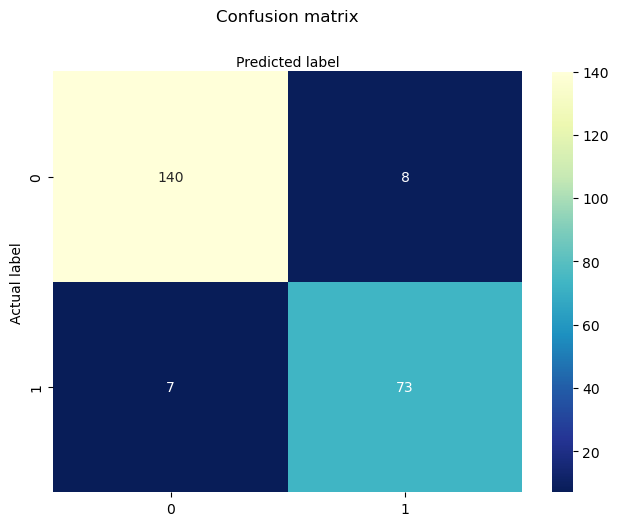

In [29]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
classifier = classifier.fit(X_train,y_train)
y_pred = classifier.predict(X_test)
evaluate()

Confusion Matrix
[[139   9]
 [  7  73]]
Accuracy: 0.9298245614035088
Precision: 0.8902439024390244
Recall: 0.9125


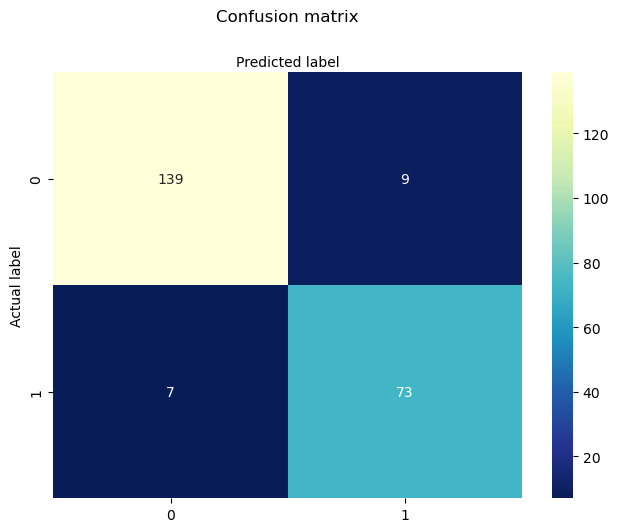

In [30]:
classifier = DecisionTreeClassifier(ccp_alpha = 0.005) #pruning tree level
classifier = classifier.fit(X_train,y_train)
y_pred = classifier.predict(X_test)
evaluate()

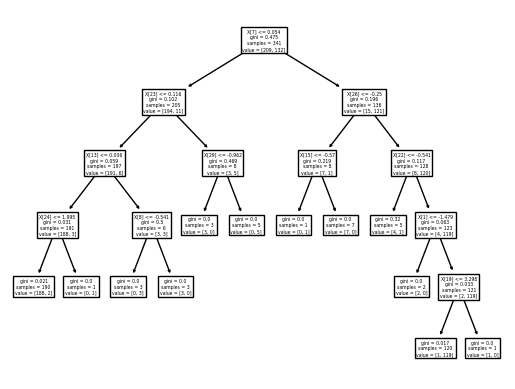

In [31]:
from sklearn import tree
tree.plot_tree(classifier); #output of what the tree looks  like

## Random forest

Confusion Matrix
[[146   2]
 [  4  76]]
Accuracy: 0.9736842105263158
Precision: 0.9743589743589743
Recall: 0.95


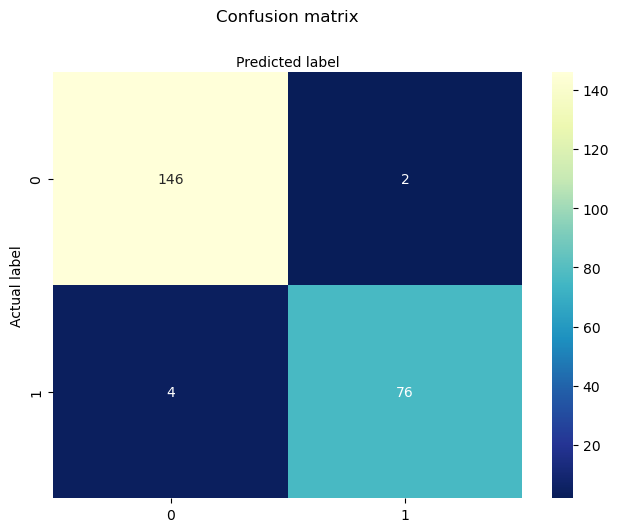

In [32]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train,y_train)
y_pred = classifier.predict(X_test)
evaluate()

## Perceptron

Confusion Matrix
[[143   5]
 [  2  78]]
Accuracy: 0.9692982456140351
Precision: 0.9397590361445783
Recall: 0.975


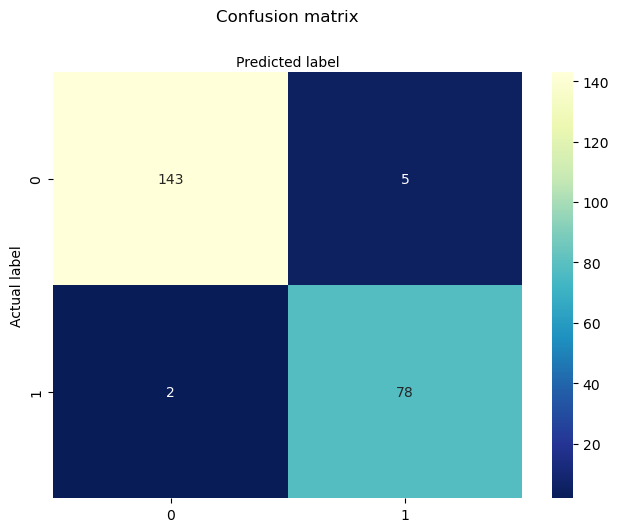

In [33]:
from sklearn.linear_model import Perceptron 
model=Perceptron(eta0=0.1,max_iter=1000)
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
evaluate()

In [34]:
from sklearn.model_selection import GridSearchCV 
grid=dict()
grid['eta0']= [0.001,0.01,0.1,1.0]
search=GridSearchCV(model, grid)
results=search.fit(X_train,y_train)
means=results.cv_results_['mean_test_score']
params=results.cv_results_['params']
for mean,param in zip(means, params):
    print(">%.3f with: %r" % (mean,param))

>0.947 with: {'eta0': 0.001}
>0.953 with: {'eta0': 0.01}
>0.965 with: {'eta0': 0.1}
>0.962 with: {'eta0': 1.0}


## Support vector machine

### Linear kernel

Confusion Matrix
[[142   6]
 [  2  78]]
Accuracy: 0.9649122807017544
Precision: 0.9285714285714286
Recall: 0.975


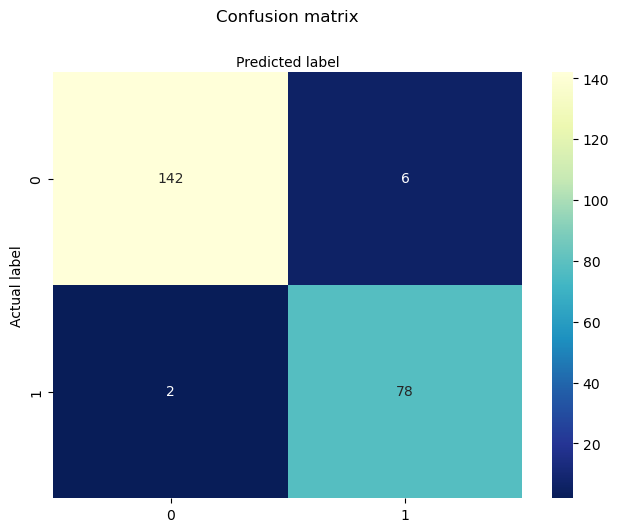

In [35]:
from sklearn import svm
clf = svm.SVC(kernel='linear')  
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
evaluate()

#### tuning hyperparameters

In [36]:
#Create a sum Classifier
clf = svm.SVC(kernel='linear',C=0.02) # Linear Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9868421052631579
Precision: 0.9873417721518988
Recall: 0.975


Confusion Matrix
[[147   1]
 [  2  78]]
Accuracy: 0.9868421052631579
Precision: 0.9873417721518988
Recall: 0.975


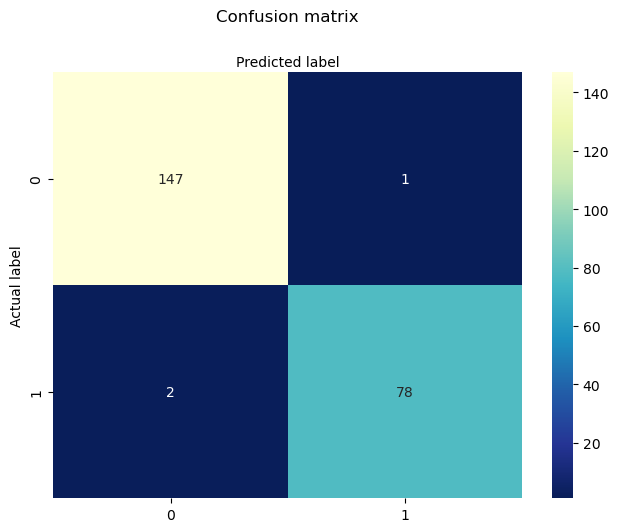

In [37]:
evaluate()

By inputting different values of c, we found an increase in all metric values as we decreased c, but with a definite optimum value. Anything less than 0.02 resulted in a drop in metric values

In [38]:
#Create a sum Classifier
clf = svm.SVC(kernel='linear',gamma='auto') # Linear Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9649122807017544
Precision: 0.9285714285714286
Recall: 0.975


No value of gamma changed the metric variables.

In [39]:
#Create a sum Classifier
clf = svm.SVC(kernel='linear',C=0.2,gamma='auto') # Linear Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9780701754385965
Precision: 0.9629629629629629
Recall: 0.975


Gamma decreased the metrics with regularity (C).

### Polynomial kernel

Confusion Matrix
[[148   0]
 [ 23  57]]
Accuracy: 0.8991228070175439
Precision: 1.0
Recall: 0.7125


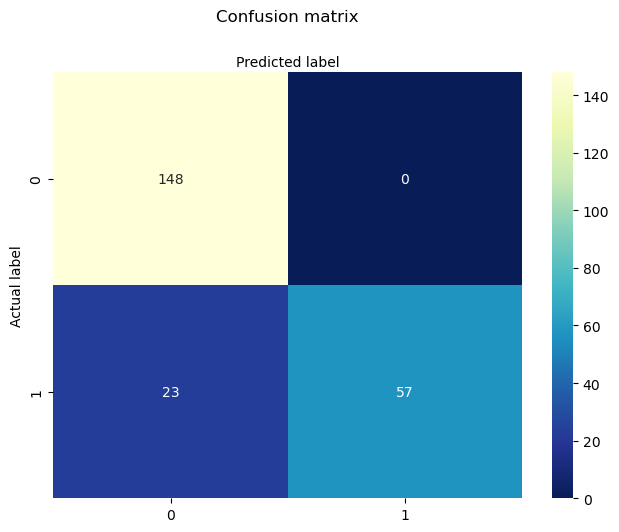

In [40]:
#Create a sum Classifier
clf = svm.SVC(kernel='poly') # polynomial Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
evaluate()

In [41]:
clf = svm.SVC(kernel='poly', C=200000) # polynomial Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9429824561403509
Precision: 0.9135802469135802
Recall: 0.925


For polynomial kernel, a higher C value resulted in all metric values increasing

Gamma changes to 'auto' did not finish and took 3 hours

Confusion Matrix
[[141   7]
 [  6  74]]
Accuracy: 0.9429824561403509
Precision: 0.9135802469135802
Recall: 0.925


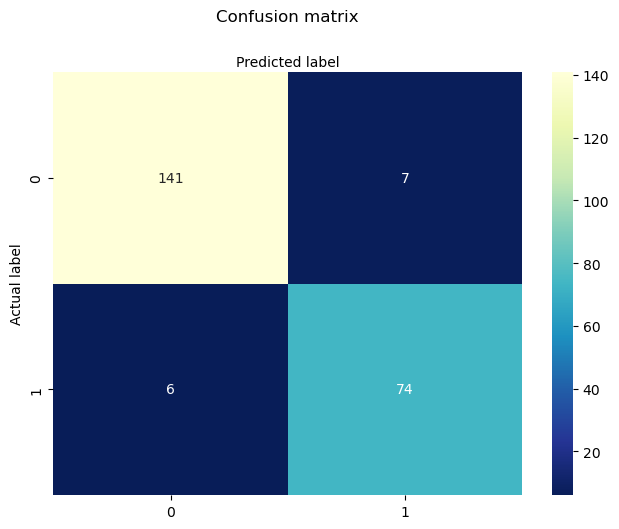

In [42]:
evaluate()

### Radial basis function kernel

In [43]:
clf = svm.SVC(kernel='rbf') # radial basis function Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9736842105263158
Precision: 0.9512195121951219
Recall: 0.975


In [44]:
clf = svm.SVC(kernel='rbf', C=10) # radial basis function Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9736842105263158
Precision: 0.9512195121951219
Recall: 0.975


Confusion Matrix
[[144   4]
 [  2  78]]
Accuracy: 0.9736842105263158
Precision: 0.9512195121951219
Recall: 0.975


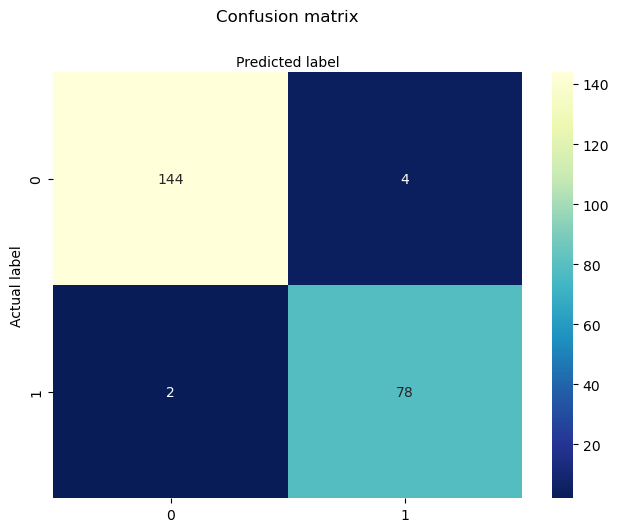

In [45]:
evaluate()

### Sigmoid kernel

In [46]:
clf = svm.SVC(kernel='sigmoid') # sigmoid Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9605263157894737
Precision: 0.9176470588235294
Recall: 0.975


Confusion Matrix
[[141   7]
 [  2  78]]
Accuracy: 0.9605263157894737
Precision: 0.9176470588235294
Recall: 0.975


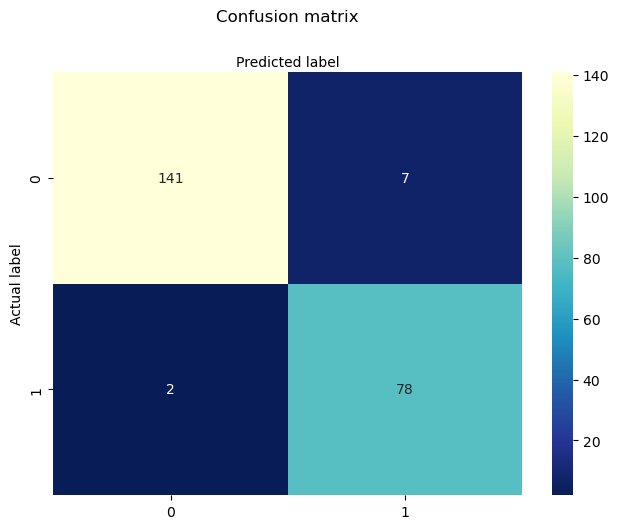

In [47]:
evaluate()

In [48]:
clf = svm.SVC(kernel='sigmoid', C=0.01) # sigmoid Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.868421052631579
Precision: 1.0
Recall: 0.625


In [49]:
clf = svm.SVC(kernel='sigmoid', gamma='auto') # sigmoid Kernel
#Train the model using the training sets 
clf.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score (y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred))
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred))

Accuracy: 0.9605263157894737
Precision: 0.9176470588235294
Recall: 0.975


Confusion Matrix
[[141   7]
 [  2  78]]
Accuracy: 0.9605263157894737
Precision: 0.9176470588235294
Recall: 0.975


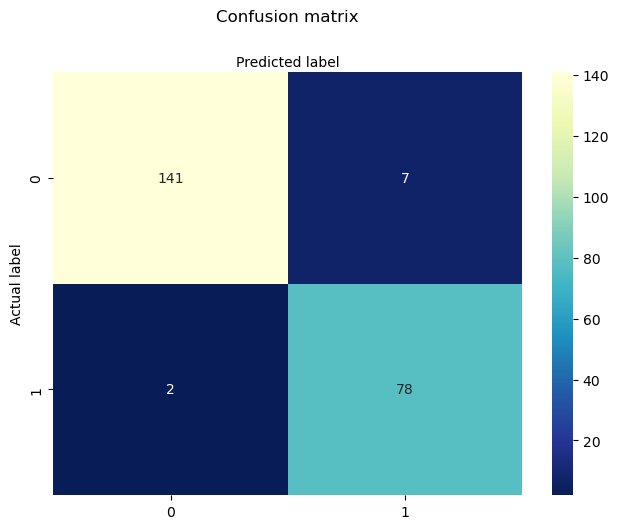

In [50]:
evaluate()

## Deep learning

Out of curiosity, we will now look at ANN deep learning to see if we can get a better result.

In [51]:
import tensorflow as tf
import tensorflow.keras
from keras import Sequential, optimizers
from keras.layers import Dense


In [52]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.4, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train))
X_test = pd.DataFrame(scaler.transform(X_test))

y_train = tf.keras.utils.to_categorical(y_train,2)
y_test = tf.keras.utils.to_categorical(y_test,2)
with tf.device('cpu:0'):
    model = Sequential()
    model.add(Dense(16, input_dim=30,kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(16,kernel_initializer='he_uniform', activation='relu'))
    model.add(Dense(2, activation='linear'))
    model.summary()
    model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=1000, batch_size=128,  verbose=1, validation_data=(X_test, y_test))

    model.evaluate(
        x=X_train,
        y=y_train,
        batch_size=None,
        verbose="auto",
        sample_weight=None,
        steps=None,
        callbacks=None,
        max_queue_size=10,
        workers=1,
        use_multiprocessing=False,
        return_dict=False)

Metal device set to: Apple M1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                496       
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 2)                 34        
                                                                 
Total params: 802
Trainable params: 802
Non-trainable params: 0
_________________________________________________________________
Epoch 1/1000


2023-01-16 16:22:56.202158: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-01-16 16:22:56.202176: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-01-16 16:22:56.259750: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


3/3 [==============================] - 0s 44ms/step - loss: 4.0045 - accuracy: 0.6246 - val_loss: 3.5526 - val_accuracy: 0.6535
Epoch 2/1000
3/3 [==============================] - 0s 5ms/step - loss: 3.6750 - accuracy: 0.6305 - val_loss: 3.2689 - val_accuracy: 0.6579
Epoch 3/1000
3/3 [==============================] - 0s 5ms/step - loss: 3.4624 - accuracy: 0.6364 - val_loss: 3.0905 - val_accuracy: 0.6667
Epoch 4/1000
3/3 [==============================] - 0s 6ms/step - loss: 3.2433 - accuracy: 0.6481 - val_loss: 2.9414 - val_accuracy: 0.6711
Epoch 5/1000
3/3 [==============================] - 0s 5ms/step - loss: 3.1242 - accuracy: 0.6598 - val_loss: 2.8308 - val_accuracy: 0.6930
Epoch 6/1000
3/3 [==============================] - 0s 6ms/step - loss: 3.0110 - accuracy: 0.6598 - val_loss: 2.8020 - val_accuracy: 0.7018
Epoch 7/1000
3/3 [==============================] - 0s 6ms/step - loss: 2.9083 - accuracy: 0.6598 - val_loss: 2.6894 - val_accuracy: 0.7061
Epoch 8/1000
3/3 [==============

2023-01-16 16:22:56.562681: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x1059d3a90 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2023-01-16 16:22:56.562695: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Host, Default Version
2023-01-16 16:22:56.565675: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-01-16 16:22:56.581767: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3/3 [==============================] - 0s 6ms/step - loss: 2.6971 - accuracy: 0.6804 - val_loss: 2.4386 - val_accuracy: 0.7149
Epoch 10/1000
3/3 [==============================] - 0s 5ms/step - loss: 2.5188 - accuracy: 0.6804 - val_loss: 2.3813 - val_accuracy: 0.7193
Epoch 11/1000
3/3 [==============================] - 0s 6ms/step - loss: 2.4535 - accuracy: 0.6862 - val_loss: 2.3155 - val_accuracy: 0.7237
Epoch 12/1000
3/3 [==============================] - 0s 5ms/step - loss: 2.3486 - accuracy: 0.7009 - val_loss: 2.1428 - val_accuracy: 0.7237
Epoch 13/1000
3/3 [==============================] - 0s 5ms/step - loss: 2.2446 - accuracy: 0.7097 - val_loss: 2.0459 - val_accuracy: 0.7412
Epoch 14/1000
3/3 [==============================] - 0s 6ms/step - loss: 2.1352 - accuracy: 0.7214 - val_loss: 1.9246 - val_accuracy: 0.7456
Epoch 15/1000
3/3 [==============================] - 0s 5ms/step - loss: 2.0468 - accuracy: 0.7243 - val_loss: 1.8793 - val_accuracy: 0.7456
Epoch 16/1000
3/3 [========

3/3 [==============================] - 0s 5ms/step - loss: 0.4919 - accuracy: 0.9355 - val_loss: 0.3841 - val_accuracy: 0.9430
Epoch 126/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4908 - accuracy: 0.9355 - val_loss: 0.3622 - val_accuracy: 0.9430
Epoch 127/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4899 - accuracy: 0.9355 - val_loss: 0.3591 - val_accuracy: 0.9430
Epoch 128/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4889 - accuracy: 0.9355 - val_loss: 0.3565 - val_accuracy: 0.9430
Epoch 129/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4879 - accuracy: 0.9355 - val_loss: 0.3544 - val_accuracy: 0.9474
Epoch 130/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4869 - accuracy: 0.9355 - val_loss: 0.3525 - val_accuracy: 0.9474
Epoch 131/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.4860 - accuracy: 0.9355 - val_loss: 0.3276 - val_accuracy: 0.9474
Epoch 132/1000
3/3 [=

Epoch 183/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.3572 - accuracy: 0.9472 - val_loss: 0.2055 - val_accuracy: 0.9649
Epoch 184/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.3567 - accuracy: 0.9472 - val_loss: 0.2049 - val_accuracy: 0.9649
Epoch 185/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.3562 - accuracy: 0.9472 - val_loss: 0.2043 - val_accuracy: 0.9649
Epoch 186/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.3557 - accuracy: 0.9472 - val_loss: 0.2038 - val_accuracy: 0.9649
Epoch 187/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.3551 - accuracy: 0.9472 - val_loss: 0.2033 - val_accuracy: 0.9649
Epoch 188/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.3547 - accuracy: 0.9501 - val_loss: 0.2027 - val_accuracy: 0.9649
Epoch 189/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.3542 - accuracy: 0.9501 - val_loss: 0.2022 - val_accuracy: 0.9649
Epoch 

Epoch 241/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2101 - accuracy: 0.9648 - val_loss: 0.1241 - val_accuracy: 0.9737
Epoch 242/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2097 - accuracy: 0.9648 - val_loss: 0.1238 - val_accuracy: 0.9737
Epoch 243/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2093 - accuracy: 0.9648 - val_loss: 0.1234 - val_accuracy: 0.9737
Epoch 244/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2089 - accuracy: 0.9648 - val_loss: 0.1231 - val_accuracy: 0.9737
Epoch 245/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2085 - accuracy: 0.9648 - val_loss: 0.1227 - val_accuracy: 0.9737
Epoch 246/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2081 - accuracy: 0.9648 - val_loss: 0.1224 - val_accuracy: 0.9737
Epoch 247/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.2078 - accuracy: 0.9648 - val_loss: 0.1221 - val_accuracy: 0.9737
Epoch 

Epoch 299/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1925 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 300/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 301/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1921 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 302/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1918 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 303/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1916 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 304/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1914 - accuracy: 0.9648 - val_loss: 0.1133 - val_accuracy: 0.9693
Epoch 305/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 0.9648 - val_loss: 0.1132 - val_accuracy: 0.9693
Epoch 

Epoch 357/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1811 - accuracy: 0.9677 - val_loss: 0.1117 - val_accuracy: 0.9605
Epoch 358/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1809 - accuracy: 0.9677 - val_loss: 0.1113 - val_accuracy: 0.9605
Epoch 359/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1807 - accuracy: 0.9677 - val_loss: 0.1111 - val_accuracy: 0.9605
Epoch 360/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1806 - accuracy: 0.9677 - val_loss: 0.1108 - val_accuracy: 0.9605
Epoch 361/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1804 - accuracy: 0.9677 - val_loss: 0.1106 - val_accuracy: 0.9605
Epoch 362/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1803 - accuracy: 0.9677 - val_loss: 0.1105 - val_accuracy: 0.9605
Epoch 363/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1801 - accuracy: 0.9677 - val_loss: 0.1104 - val_accuracy: 0.9605
Epoch 

Epoch 415/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1726 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 416/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1724 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 417/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1723 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 418/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1722 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 419/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1721 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 420/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1719 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 421/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1718 - accuracy: 0.9736 - val_loss: 0.1289 - val_accuracy: 0.9605
Epoch 

Epoch 473/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1107 - accuracy: 0.9853 - val_loss: 0.1423 - val_accuracy: 0.9605
Epoch 474/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1103 - accuracy: 0.9853 - val_loss: 0.1407 - val_accuracy: 0.9605
Epoch 475/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1099 - accuracy: 0.9853 - val_loss: 0.1400 - val_accuracy: 0.9605
Epoch 476/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1095 - accuracy: 0.9853 - val_loss: 0.1395 - val_accuracy: 0.9605
Epoch 477/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1093 - accuracy: 0.9853 - val_loss: 0.1392 - val_accuracy: 0.9605
Epoch 478/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1090 - accuracy: 0.9853 - val_loss: 0.1389 - val_accuracy: 0.9605
Epoch 479/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1088 - accuracy: 0.9853 - val_loss: 0.1388 - val_accuracy: 0.9605
Epoch 

Epoch 531/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1012 - accuracy: 0.9853 - val_loss: 0.1592 - val_accuracy: 0.9605
Epoch 532/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1011 - accuracy: 0.9853 - val_loss: 0.1592 - val_accuracy: 0.9605
Epoch 533/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1009 - accuracy: 0.9853 - val_loss: 0.1592 - val_accuracy: 0.9605
Epoch 534/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1008 - accuracy: 0.9853 - val_loss: 0.1591 - val_accuracy: 0.9605
Epoch 535/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1008 - accuracy: 0.9853 - val_loss: 0.1380 - val_accuracy: 0.9605
Epoch 536/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1006 - accuracy: 0.9853 - val_loss: 0.1371 - val_accuracy: 0.9649
Epoch 537/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.1005 - accuracy: 0.9853 - val_loss: 0.1364 - val_accuracy: 0.9649
Epoch 

Epoch 589/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0955 - accuracy: 0.9853 - val_loss: 0.1316 - val_accuracy: 0.9605
Epoch 590/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0954 - accuracy: 0.9853 - val_loss: 0.1318 - val_accuracy: 0.9605
Epoch 591/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0954 - accuracy: 0.9853 - val_loss: 0.1319 - val_accuracy: 0.9605
Epoch 592/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0953 - accuracy: 0.9853 - val_loss: 0.1318 - val_accuracy: 0.9605
Epoch 593/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0952 - accuracy: 0.9853 - val_loss: 0.1319 - val_accuracy: 0.9605
Epoch 594/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0951 - accuracy: 0.9853 - val_loss: 0.1320 - val_accuracy: 0.9605
Epoch 595/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0950 - accuracy: 0.9853 - val_loss: 0.1319 - val_accuracy: 0.9605
Epoch 

Epoch 647/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0912 - accuracy: 0.9883 - val_loss: 0.1358 - val_accuracy: 0.9605
Epoch 648/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0911 - accuracy: 0.9883 - val_loss: 0.1359 - val_accuracy: 0.9605
Epoch 649/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0910 - accuracy: 0.9883 - val_loss: 0.1359 - val_accuracy: 0.9605
Epoch 650/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0910 - accuracy: 0.9883 - val_loss: 0.1361 - val_accuracy: 0.9605
Epoch 651/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0909 - accuracy: 0.9883 - val_loss: 0.1363 - val_accuracy: 0.9605
Epoch 652/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0908 - accuracy: 0.9883 - val_loss: 0.1364 - val_accuracy: 0.9605
Epoch 653/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0908 - accuracy: 0.9883 - val_loss: 0.1360 - val_accuracy: 0.9605
Epoch 

Epoch 705/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0871 - accuracy: 0.9883 - val_loss: 0.1196 - val_accuracy: 0.9649
Epoch 706/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0871 - accuracy: 0.9883 - val_loss: 0.1204 - val_accuracy: 0.9649
Epoch 707/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0870 - accuracy: 0.9883 - val_loss: 0.1204 - val_accuracy: 0.9649
Epoch 708/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0870 - accuracy: 0.9883 - val_loss: 0.1204 - val_accuracy: 0.9649
Epoch 709/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0869 - accuracy: 0.9883 - val_loss: 0.1206 - val_accuracy: 0.9649
Epoch 710/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0868 - accuracy: 0.9883 - val_loss: 0.1210 - val_accuracy: 0.9649
Epoch 711/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0868 - accuracy: 0.9883 - val_loss: 0.1221 - val_accuracy: 0.9649
Epoch 

Epoch 763/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0836 - accuracy: 0.9883 - val_loss: 0.1667 - val_accuracy: 0.9649
Epoch 764/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0835 - accuracy: 0.9883 - val_loss: 0.1648 - val_accuracy: 0.9649
Epoch 765/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0834 - accuracy: 0.9883 - val_loss: 0.1644 - val_accuracy: 0.9649
Epoch 766/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0834 - accuracy: 0.9883 - val_loss: 0.1653 - val_accuracy: 0.9649
Epoch 767/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0833 - accuracy: 0.9883 - val_loss: 0.1659 - val_accuracy: 0.9649
Epoch 768/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0833 - accuracy: 0.9883 - val_loss: 0.1659 - val_accuracy: 0.9649
Epoch 769/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0832 - accuracy: 0.9883 - val_loss: 0.1663 - val_accuracy: 0.9649
Epoch 

Epoch 821/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0808 - accuracy: 0.9883 - val_loss: 0.1615 - val_accuracy: 0.9649
Epoch 822/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0807 - accuracy: 0.9883 - val_loss: 0.1617 - val_accuracy: 0.9649
Epoch 823/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0807 - accuracy: 0.9883 - val_loss: 0.1621 - val_accuracy: 0.9649
Epoch 824/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0806 - accuracy: 0.9883 - val_loss: 0.1618 - val_accuracy: 0.9649
Epoch 825/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0806 - accuracy: 0.9883 - val_loss: 0.1626 - val_accuracy: 0.9649
Epoch 826/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0806 - accuracy: 0.9883 - val_loss: 0.1625 - val_accuracy: 0.9649
Epoch 827/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0805 - accuracy: 0.9883 - val_loss: 0.1612 - val_accuracy: 0.9649
Epoch 

Epoch 879/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 0.9883 - val_loss: 0.1622 - val_accuracy: 0.9649
Epoch 880/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 0.9883 - val_loss: 0.1612 - val_accuracy: 0.9649
Epoch 881/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0783 - accuracy: 0.9883 - val_loss: 0.1606 - val_accuracy: 0.9649
Epoch 882/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0783 - accuracy: 0.9883 - val_loss: 0.1602 - val_accuracy: 0.9649
Epoch 883/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0783 - accuracy: 0.9883 - val_loss: 0.1605 - val_accuracy: 0.9649
Epoch 884/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0782 - accuracy: 0.9883 - val_loss: 0.1616 - val_accuracy: 0.9649
Epoch 885/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0782 - accuracy: 0.9883 - val_loss: 0.1623 - val_accuracy: 0.9649
Epoch 

Epoch 937/1000
3/3 [==============================] - 0s 6ms/step - loss: 0.0767 - accuracy: 0.9883 - val_loss: 0.1648 - val_accuracy: 0.9649
Epoch 938/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9883 - val_loss: 0.1651 - val_accuracy: 0.9649
Epoch 939/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9883 - val_loss: 0.1661 - val_accuracy: 0.9649
Epoch 940/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9883 - val_loss: 0.1667 - val_accuracy: 0.9649
Epoch 941/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9883 - val_loss: 0.1696 - val_accuracy: 0.9649
Epoch 942/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0765 - accuracy: 0.9883 - val_loss: 0.1631 - val_accuracy: 0.9649
Epoch 943/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0765 - accuracy: 0.9883 - val_loss: 0.1641 - val_accuracy: 0.9649
Epoch 

Epoch 995/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0753 - accuracy: 0.9941 - val_loss: 0.1861 - val_accuracy: 0.9649
Epoch 996/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9941 - val_loss: 0.1861 - val_accuracy: 0.9649
Epoch 997/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9941 - val_loss: 0.1860 - val_accuracy: 0.9649
Epoch 998/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9941 - val_loss: 0.1859 - val_accuracy: 0.9649
Epoch 999/1000
3/3 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9941 - val_loss: 0.1859 - val_accuracy: 0.9649
Epoch 1000/1000
11/11 [==============================] - 0s 392us/step - loss: 0.0751 - accuracy: 0.9941


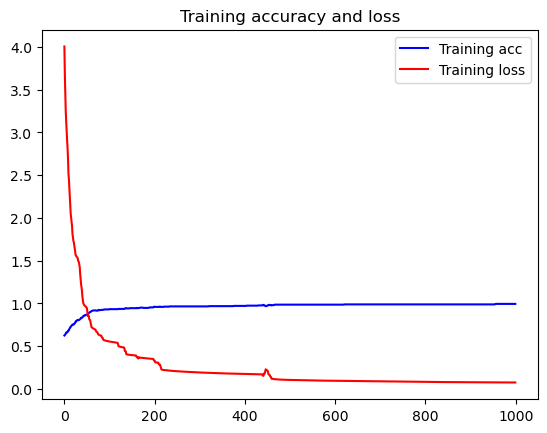

8/8 [==============================] - 0s 470us/step


In [53]:
acc = history.history['accuracy']

loss = history.history['loss']


epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, loss, 'r', label='Training loss')
plt.title('Training accuracy and loss')
plt.legend()

plt.show()
with tf.device('cpu:0'):
    y_pred = np.argmax(model.predict(X_test),axis=1)
y_pred = tf.keras.utils.to_categorical(y_pred,2)
# Model Accuracy: how often is the classifier correct?
#print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
# Model Precision: what percentage of positive tuples are labeled as such?
#print("Precision:",metrics.precision_score(y_test, y_pred, average=None)[0])
# Model Recall: what percentage of positive tuples are labelled as such?
#print("Recall:",metrics.recall_score(y_test, y_pred, average=None)[0])

In [54]:
cnf_matrix = metrics.confusion_matrix(y_test[:,0], y_pred[:,0])
cnf_matrix = np.flip(np.flip(cnf_matrix, 1), 0) #rotate matrix 180degrees
cnf_matrix

array([[143,   5],
       [  3,  77]])

In [55]:
FP=cnf_matrix[0,1]
FN=cnf_matrix[1,0]
TP=cnf_matrix[1,1]
TN=cnf_matrix[0,0]
#defining accuracy, precision and recall as metrics._score was not correct
precision = TP/(TP + FP)
recall = TP / (TP + FN)
accuracy = (TP + TN)/(TP + TN + FP + FN)

In [56]:
# Model Accuracy: how often is the classifier correct?
print("Accuracy:",accuracy)
# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",precision)
# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",recall)

Accuracy: 0.9649122807017544
Precision: 0.9390243902439024
Recall: 0.9625


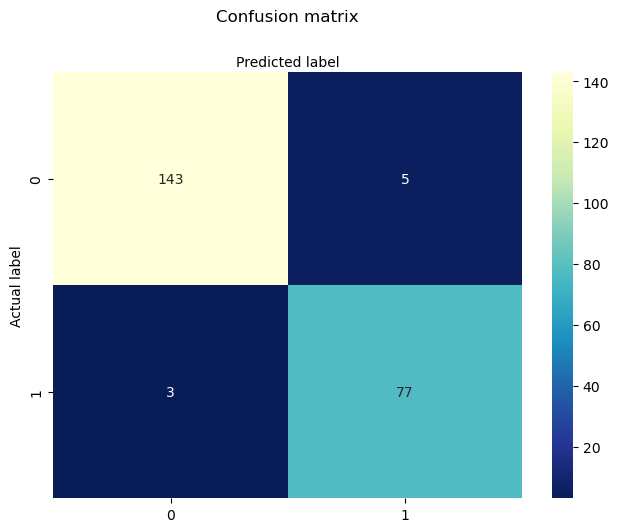

In [57]:
class_names= [0,1] # name of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap='YlGnBu_r' ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()